# Visualize VGG16 Filters

![VGG 16](vgg16.png)


## Filter Visualization
![VGG 16](conv5_2_stitched_filters_8x3.png)

# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Visualize-VGG16-Filters" data-toc-modified-id="Visualize-VGG16-Filters-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Visualize VGG16 Filters</a></div><div class="lev2 toc-item"><a href="#Filter-Visualization" data-toc-modified-id="Filter-Visualization-11"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Filter Visualization</a></div><div class="lev2 toc-item"><a href="#Import" data-toc-modified-id="Import-12"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Import</a></div><div class="lev2 toc-item"><a href="#Build-the-VGG16-Model" data-toc-modified-id="Build-the-VGG16-Model-13"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Build the VGG16 Model</a></div><div class="lev2 toc-item"><a href="#Initialize-Image" data-toc-modified-id="Initialize-Image-14"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Initialize Image</a></div><div class="lev2 toc-item"><a href="#Setup-Model" data-toc-modified-id="Setup-Model-15"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Setup Model</a></div><div class="lev2 toc-item"><a href="#Execution" data-toc-modified-id="Execution-16"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>Execution</a></div><div class="lev2 toc-item"><a href="#Loop-trough-Filters" data-toc-modified-id="Loop-trough-Filters-17"><span class="toc-item-num">1.7&nbsp;&nbsp;</span>Loop trough Filters</a></div><div class="lev2 toc-item"><a href="#Conv1" data-toc-modified-id="Conv1-18"><span class="toc-item-num">1.8&nbsp;&nbsp;</span>Conv1</a></div><div class="lev2 toc-item"><a href="#Conv2" data-toc-modified-id="Conv2-19"><span class="toc-item-num">1.9&nbsp;&nbsp;</span>Conv2</a></div><div class="lev2 toc-item"><a href="#Conv3" data-toc-modified-id="Conv3-110"><span class="toc-item-num">1.10&nbsp;&nbsp;</span>Conv3</a></div><div class="lev2 toc-item"><a href="#Conv4" data-toc-modified-id="Conv4-111"><span class="toc-item-num">1.11&nbsp;&nbsp;</span>Conv4</a></div><div class="lev2 toc-item"><a href="#Conv5" data-toc-modified-id="Conv5-112"><span class="toc-item-num">1.12&nbsp;&nbsp;</span>Conv5</a></div>

## Import

In [1]:
from tensorflow.contrib.keras import applications
import h5py 
from tensorflow.contrib.keras import backend as K
import numpy as np
from scipy.misc import imsave
import time
from matplotlib import pyplot as plt

In [77]:
# util function to convert a tensor into a valid image
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x = x[...,::-1] 
    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    #x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x

## Build the VGG16 Model 

In [78]:
# build the VGG16 network
model = applications.VGG16(include_top=False,weights='imagenet')
# get the symbolic outputs of each "key" layer .
layer_dict = dict([(layer.name, layer) for layer in model.layers])
layer_dict

{'block1_conv1': <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D at 0x3529a128>,
 'block1_conv2': <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D at 0x355c7c88>,
 'block1_pool': <tensorflow.contrib.keras.python.keras.layers.pooling.MaxPooling2D at 0x3531f7b8>,
 'block2_conv1': <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D at 0x352ab240>,
 'block2_conv2': <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D at 0x352ef940>,
 'block2_pool': <tensorflow.contrib.keras.python.keras.layers.pooling.MaxPooling2D at 0x34e42c88>,
 'block3_conv1': <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D at 0x34e42da0>,
 'block3_conv2': <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D at 0x353126d8>,
 'block3_conv3': <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D at 0x34ace6a0>,
 'block3_pool': <tensorflow.contrib.keras.python.keras.layers.pooling.MaxPooling2D at 0x34ae4d30>,
 'b

## Initialize Image

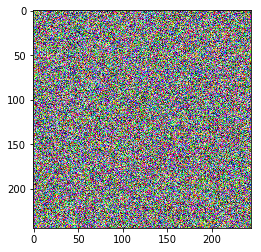

In [4]:
#start from a gray image with some noise
img_width = 244
img_height = 244
# step size for gradient ascent
step = 0.01
input_img_data = np.random.random((1, img_width, img_height, 3))
input_img_data = (input_img_data - 0.5) * 20 + 128
plt.imshow(input_img_data[0])
plt.show()

## Setup Model

In [6]:
# Get input handle
input_img = model.input
# Choose Layer
layer_name = 'block5_conv3'
# Choose filter, can be any integer from 0 to 511, as there are 512 filters in that layer
filter_index = 12  
# Get output handle
layer_output = layer_dict[layer_name].output
# build a loss function that maximizes the activation
# of the nth filter of the layer considered
loss = K.mean(layer_output[:, :, :, filter_index])
# compute the gradient of the input picture wrt this loss
grads = K.gradients(loss,input_img)[0]
# normalize the gradient to have better controll of the stepssizes
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
# this function returns the loss and grads given the input picture
iterate = K.function([input_img], [loss, grads])


## Execution

Current loss value: 0.0313554
Filter 12 processed 


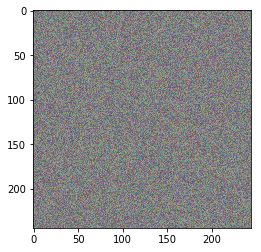

Current loss value: 0.0110576
Filter 12 processed 


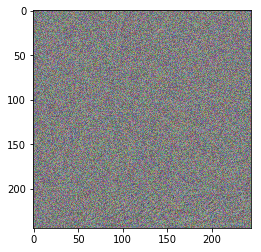

Current loss value: 0.0329136
Filter 12 processed 


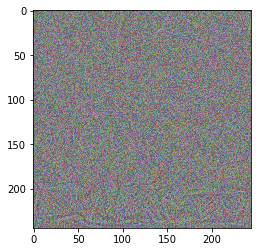

Current loss value: 0.0964058
Filter 12 processed 


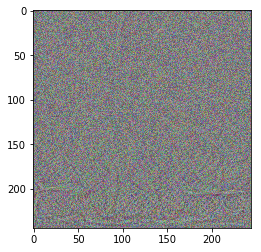

Current loss value: 0.156385
Filter 12 processed 


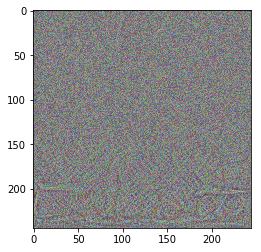

Current loss value: 0.236875
Filter 12 processed 


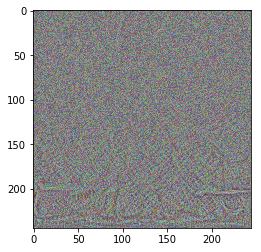

Current loss value: 0.277355
Filter 12 processed 


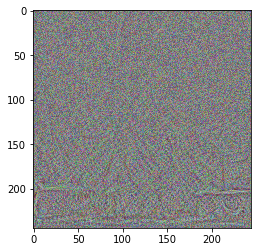

Current loss value: 0.384769
Filter 12 processed 


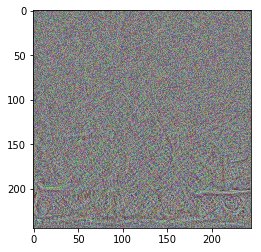

Current loss value: 0.460233
Filter 12 processed 


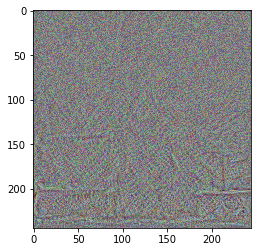

Current loss value: 0.557168
Filter 12 processed 


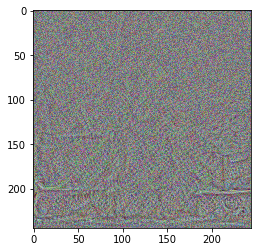

Current loss value: 0.691429
Filter 12 processed 


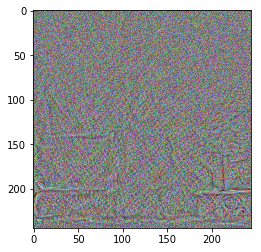

Current loss value: 0.767485
Filter 12 processed 


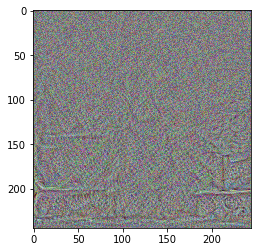

Current loss value: 0.90671
Filter 12 processed 


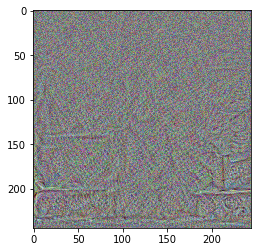

Current loss value: 1.04822
Filter 12 processed 


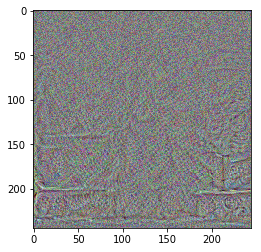

Current loss value: 1.15835
Filter 12 processed 


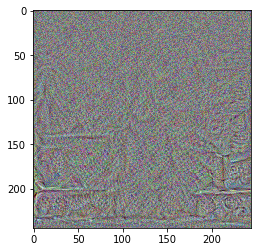

Current loss value: 1.2997
Filter 12 processed 


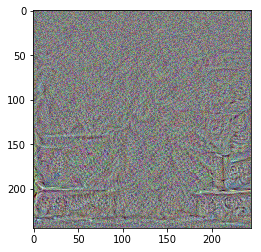

Current loss value: 1.42224
Filter 12 processed 


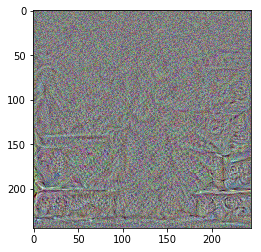

Current loss value: 1.59944
Filter 12 processed 


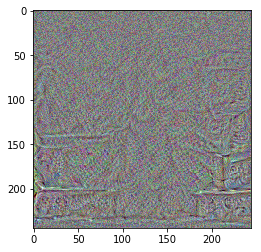

Current loss value: 1.73247
Filter 12 processed 


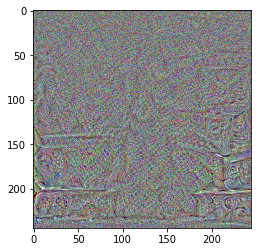

Current loss value: 1.88227
Filter 12 processed 


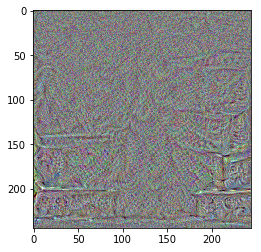

Current loss value: 2.02853
Filter 12 processed 


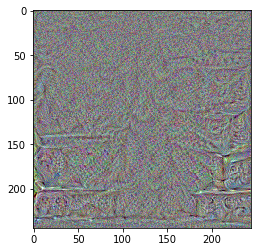

Current loss value: 2.20104
Filter 12 processed 


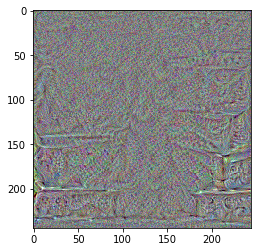

Current loss value: 2.37506
Filter 12 processed 


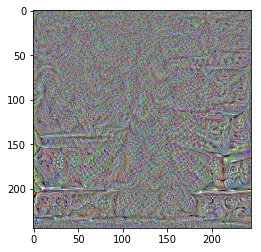

Current loss value: 2.54423
Filter 12 processed 


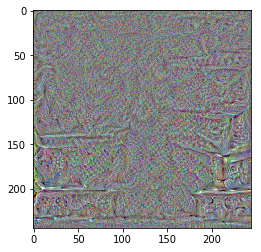

Current loss value: 2.69483
Filter 12 processed 


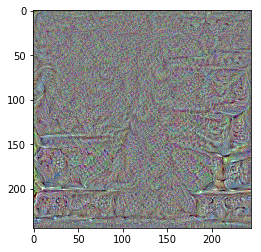

Current loss value: 2.78424
Filter 12 processed 


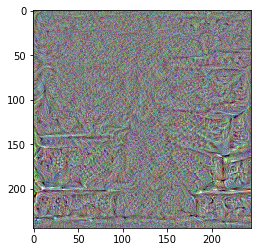

Current loss value: 2.98771
Filter 12 processed 


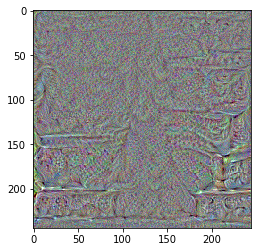

Current loss value: 3.073
Filter 12 processed 


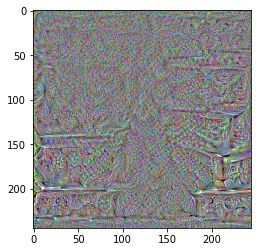

Current loss value: 3.27288
Filter 12 processed 


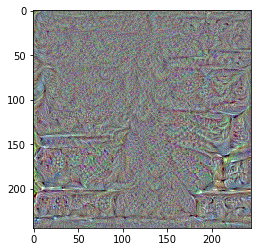

Current loss value: 3.36763
Filter 12 processed 


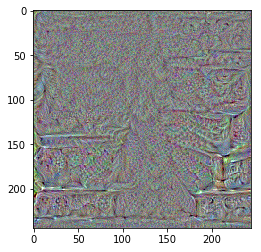

Current loss value: 3.55411
Filter 12 processed 


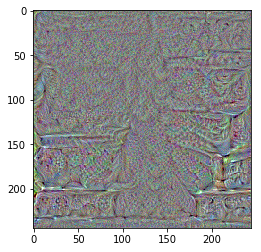

Current loss value: 3.68154
Filter 12 processed 


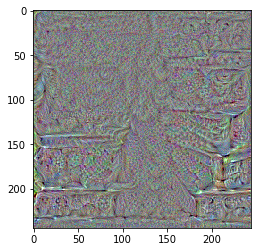

Current loss value: 3.89747
Filter 12 processed 


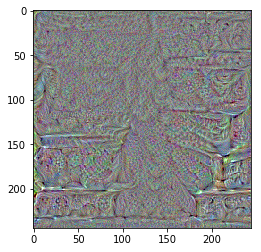

Current loss value: 4.01149
Filter 12 processed 


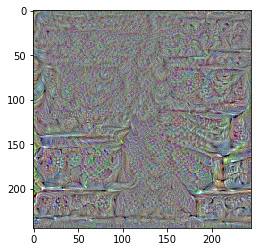

Current loss value: 4.15363
Filter 12 processed 


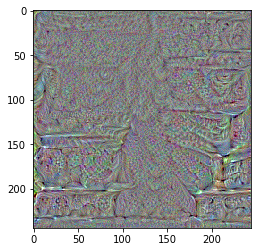

Current loss value: 4.30839
Filter 12 processed 


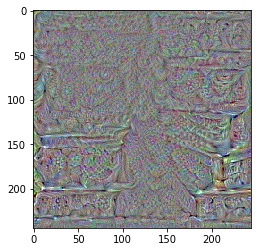

Current loss value: 4.42721
Filter 12 processed 


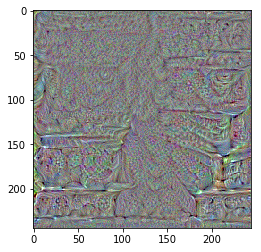

Current loss value: 4.52522
Filter 12 processed 


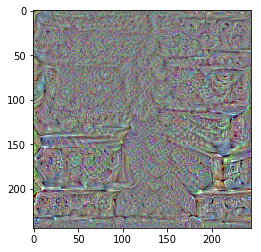

Current loss value: 4.68077
Filter 12 processed 


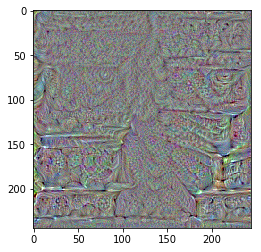

Current loss value: 4.82323
Filter 12 processed 


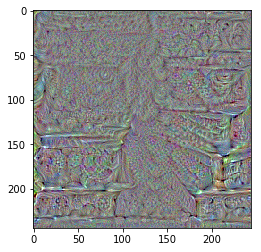

Current loss value: 4.9669
Filter 12 processed 


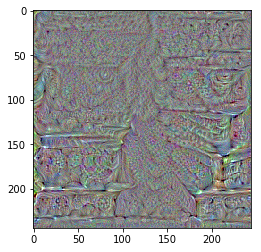

Current loss value: 5.09997
Filter 12 processed 


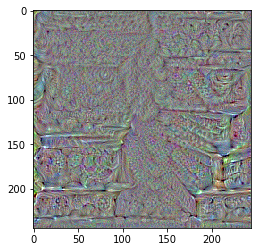

Current loss value: 5.24316
Filter 12 processed 


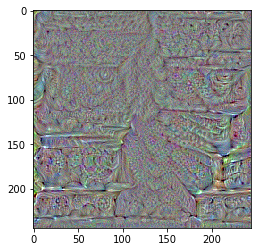

Current loss value: 5.3981
Filter 12 processed 


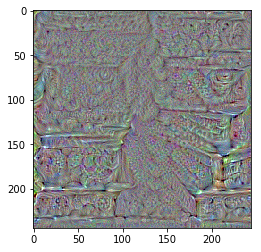

Current loss value: 5.49334
Filter 12 processed 


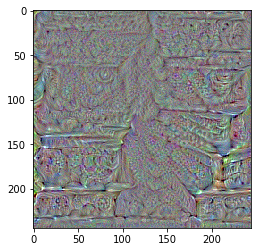

Current loss value: 5.64478
Filter 12 processed 


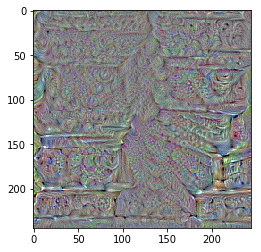

Current loss value: 5.74756
Filter 12 processed 


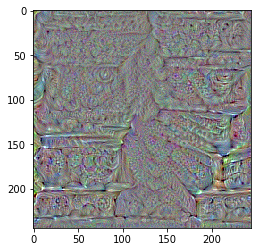

Current loss value: 5.91133
Filter 12 processed 


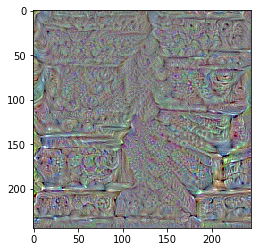

Current loss value: 6.02839
Filter 12 processed 


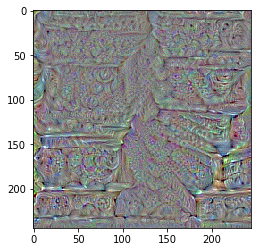

Current loss value: 6.18325
Filter 12 processed 


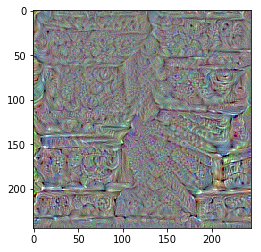

Current loss value: 6.30147
Filter 12 processed 


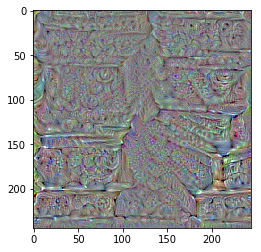

Current loss value: 6.48204
Filter 12 processed 


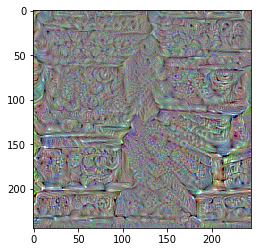

Current loss value: 6.60321
Filter 12 processed 


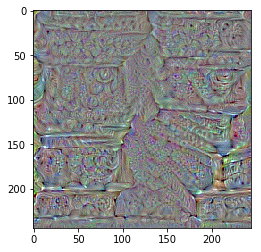

Current loss value: 6.76713
Filter 12 processed 


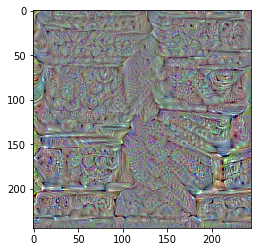

Current loss value: 6.88402
Filter 12 processed 


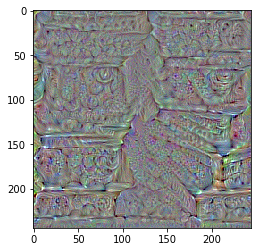

Current loss value: 7.00534
Filter 12 processed 


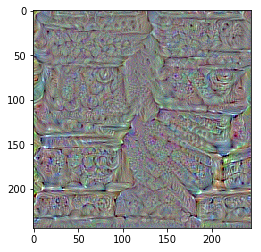

Current loss value: 7.11039
Filter 12 processed 


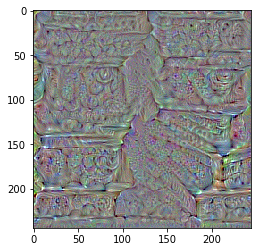

Current loss value: 7.26138
Filter 12 processed 


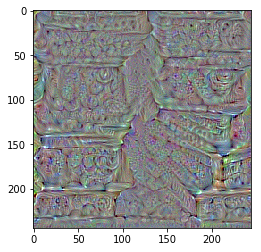

Current loss value: 7.35305
Filter 12 processed 


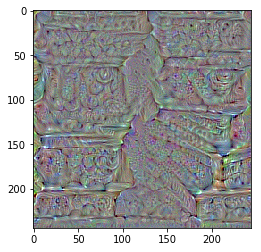

Current loss value: 7.47277
Filter 12 processed 


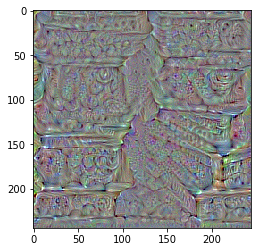

Current loss value: 7.61435
Filter 12 processed 


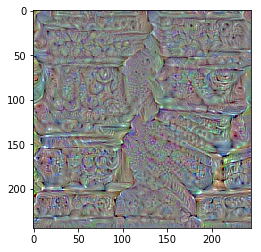

Current loss value: 7.65705
Filter 12 processed 


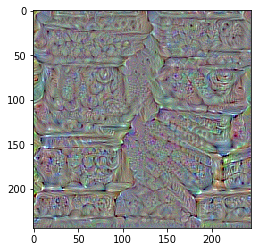

Current loss value: 7.81115
Filter 12 processed 


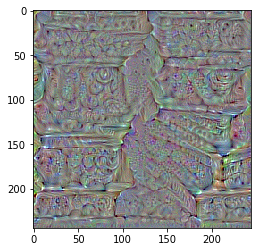

Current loss value: 7.88179
Filter 12 processed 


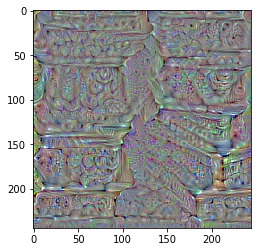

Current loss value: 8.00307
Filter 12 processed 


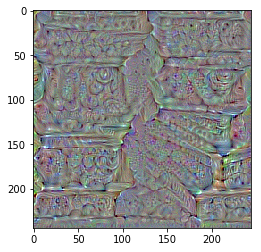

Current loss value: 8.03206
Filter 12 processed 


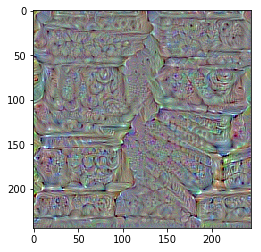

Current loss value: 8.18403
Filter 12 processed 


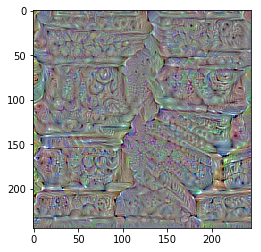

Current loss value: 8.19745
Filter 12 processed 


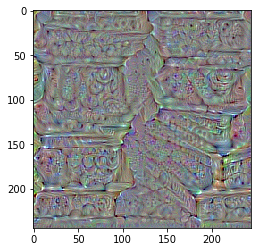

Current loss value: 8.36367
Filter 12 processed 


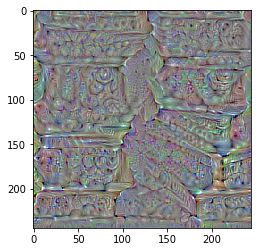

Current loss value: 8.38127
Filter 12 processed 


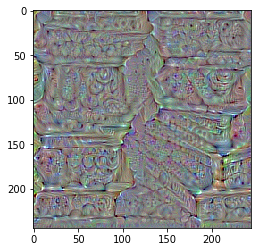

Current loss value: 8.50485
Filter 12 processed 


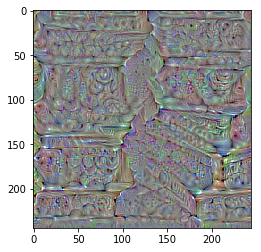

Current loss value: 8.58279
Filter 12 processed 


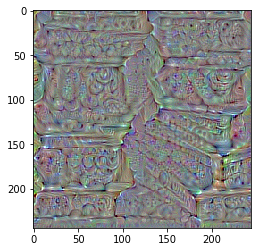

Current loss value: 8.64408
Filter 12 processed 


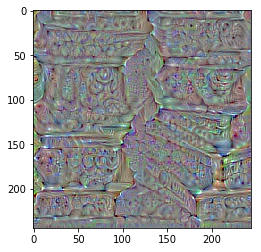

Current loss value: 8.74889
Filter 12 processed 


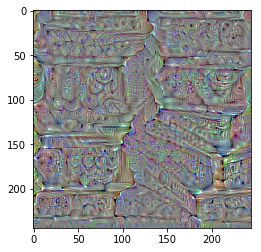

Current loss value: 8.82694
Filter 12 processed 


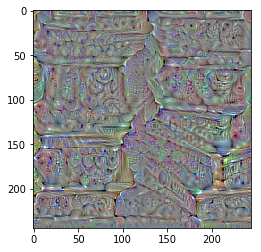

Current loss value: 8.88771
Filter 12 processed 


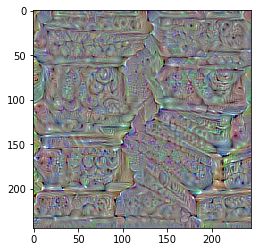

Current loss value: 8.94073
Filter 12 processed 


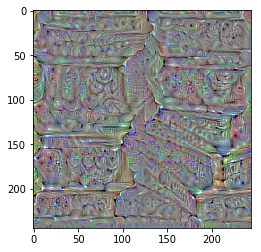

Current loss value: 9.01925
Filter 12 processed 


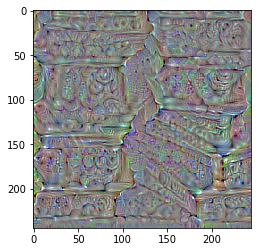

Current loss value: 9.08588
Filter 12 processed 


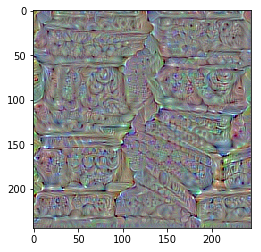

Current loss value: 9.15731
Filter 12 processed 


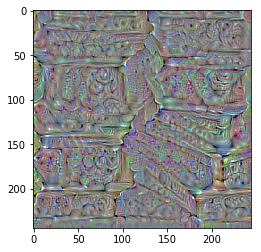

Current loss value: 9.2421
Filter 12 processed 


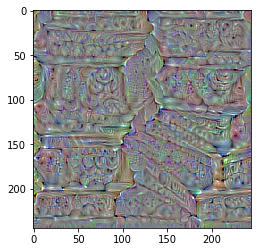

Current loss value: 9.29314
Filter 12 processed 


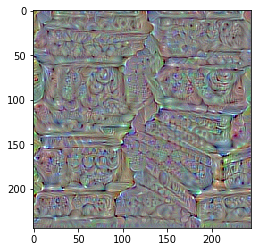

Current loss value: 9.35584
Filter 12 processed 


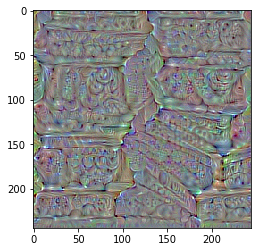

Current loss value: 9.38298
Filter 12 processed 


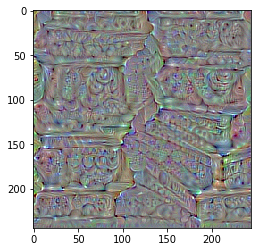

Current loss value: 9.43985
Filter 12 processed 


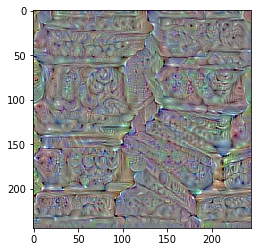

Current loss value: 9.51564
Filter 12 processed 


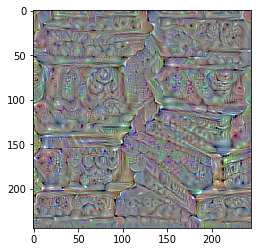

Current loss value: 9.52879
Filter 12 processed 


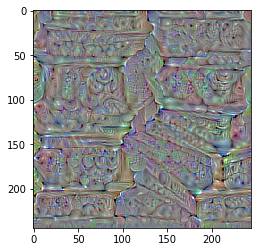

Current loss value: 9.57917
Filter 12 processed 


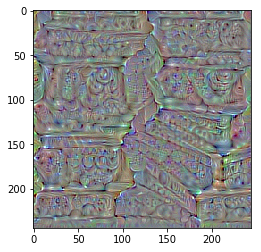

Current loss value: 9.638
Filter 12 processed 


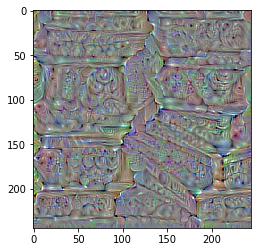

Current loss value: 9.66686
Filter 12 processed 


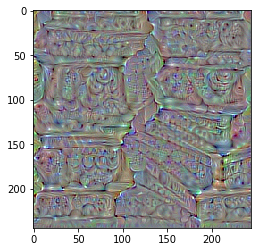

Current loss value: 9.73333
Filter 12 processed 


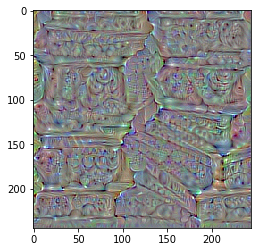

Current loss value: 9.76796
Filter 12 processed 


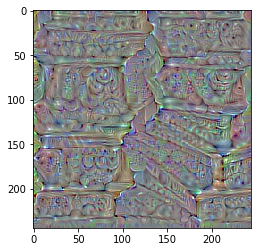

Current loss value: 9.77652
Filter 12 processed 


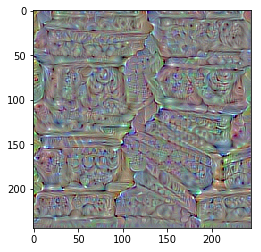

Current loss value: 9.87827
Filter 12 processed 


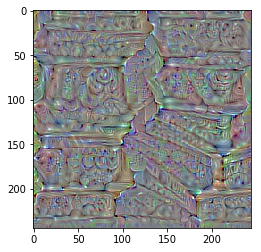

Current loss value: 9.86615
Filter 12 processed 


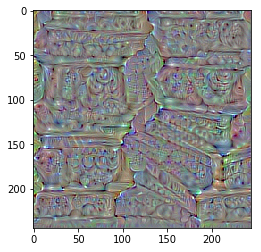

Current loss value: 9.95493
Filter 12 processed 


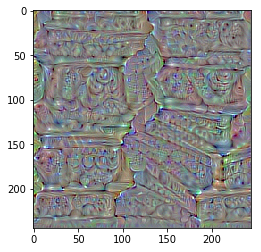

Current loss value: 9.92243
Filter 12 processed 


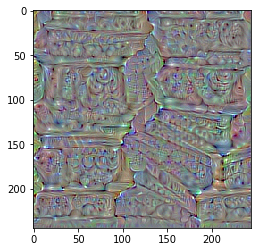

Current loss value: 10.06
Filter 12 processed 


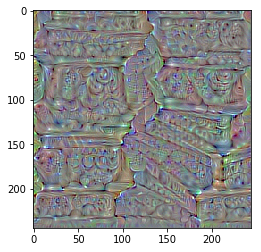

Current loss value: 9.98336
Filter 12 processed 


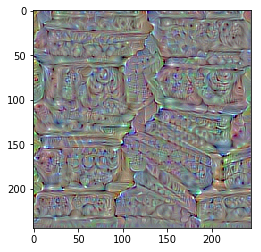

Current loss value: 10.0729
Filter 12 processed 


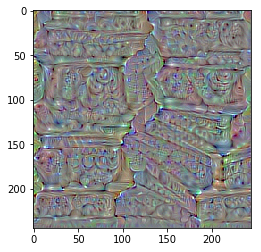

In [7]:
for i in range(100):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        print('Current loss value:', loss_value)
        img = deprocess_image(input_img_data[0])
        print('Filter %d processed ' % (filter_index))    
        plt.imshow(img)
        plt.show()

## Loop trough Filters

In [8]:
kept_filters = []
layer_name = 'block5_conv3'
input_img = model.input
for filter_index in range(500):
    print('Processing filter %d' % filter_index)
    start_time = time.time()
    layer_output = layer_dict[layer_name].output
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, input_img)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    # this function returns the loss and grads given the input picture
    iterate = K.function([input_img], [loss, grads])
    step = 0.5
    input_img_data = np.random.random((1, img_width, img_height, 3))
    input_img_data = (input_img_data - 0.5) * 20 + 128
    # run gradient ascent for 20 steps
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        print('Current loss value:', loss_value)
        if loss_value <= 0.:
             # some filters get stuck to 0, we can skip them
            break
    if loss_value > 0:
        img = deprocess_image(input_img_data[0])
        kept_filters.append((img, loss_value))
    end_time = time.time()
    print('Filter %d processed in %ds' % (filter_index, end_time - start_time))
    

Processing filter 0
Current loss value: 0.0
Filter 0 processed in 1s
Processing filter 1
Current loss value: 0.0
Filter 1 processed in 1s
Processing filter 2
Current loss value: 0.0
Filter 2 processed in 1s
Processing filter 3
Current loss value: 0.0
Filter 3 processed in 1s
Processing filter 4
Current loss value: 0.0
Filter 4 processed in 1s
Processing filter 5
Current loss value: 0.0
Filter 5 processed in 1s
Processing filter 6
Current loss value: 0.00245995
Current loss value: 0.0220983
Current loss value: 0.123968
Current loss value: 0.391064
Current loss value: 1.04523
Current loss value: 2.01411
Current loss value: 4.03885
Current loss value: 7.76809
Current loss value: 12.7989
Current loss value: 18.6062
Current loss value: 24.9908
Current loss value: 31.9893
Current loss value: 38.5325
Current loss value: 45.6001
Current loss value: 51.335
Current loss value: 57.7326
Current loss value: 64.7178
Current loss value: 73.1956
Current loss value: 79.7618
Current loss value: 86.8574


Current loss value: 0.0
Filter 39 processed in 1s
Processing filter 40
Current loss value: 0.0
Filter 40 processed in 1s
Processing filter 41
Current loss value: 0.0
Filter 41 processed in 1s
Processing filter 42
Current loss value: 0.699446
Current loss value: 4.28451
Current loss value: 8.60264
Current loss value: 13.745
Current loss value: 17.3543
Current loss value: 23.081
Current loss value: 28.6153
Current loss value: 33.1596
Current loss value: 38.1312
Current loss value: 44.5909
Current loss value: 49.3027
Current loss value: 54.6389
Current loss value: 58.8599
Current loss value: 63.6314
Current loss value: 68.2275
Current loss value: 73.8666
Current loss value: 78.3477
Current loss value: 82.0831
Current loss value: 86.7168
Current loss value: 92.1468
Current loss value: 94.3973
Current loss value: 101.003
Current loss value: 104.706
Current loss value: 109.292
Current loss value: 112.97
Current loss value: 117.994
Current loss value: 121.908
Current loss value: 126.351
Curre

Current loss value: 44.5579
Current loss value: 49.6691
Current loss value: 55.4945
Current loss value: 61.2053
Current loss value: 68.0219
Current loss value: 75.7764
Current loss value: 82.3028
Current loss value: 89.1646
Current loss value: 96.0606
Current loss value: 101.808
Current loss value: 108.057
Current loss value: 114.217
Current loss value: 121.367
Current loss value: 128.745
Current loss value: 134.548
Current loss value: 142.017
Current loss value: 149.063
Current loss value: 156.607
Current loss value: 162.303
Current loss value: 169.983
Current loss value: 177.187
Current loss value: 184.37
Current loss value: 191.381
Current loss value: 198.9
Current loss value: 208.214
Filter 56 processed in 36s
Processing filter 57
Current loss value: 0.0
Filter 57 processed in 1s
Processing filter 58
Current loss value: 0.0
Filter 58 processed in 1s
Processing filter 59
Current loss value: 0.0
Filter 59 processed in 1s
Processing filter 60
Current loss value: 0.0
Filter 60 processe

Current loss value: 175.295
Current loss value: 192.549
Current loss value: 212.312
Current loss value: 231.786
Current loss value: 253.29
Current loss value: 274.199
Current loss value: 292.025
Current loss value: 310.125
Current loss value: 325.043
Current loss value: 345.389
Current loss value: 360.083
Current loss value: 377.878
Current loss value: 392.056
Current loss value: 411.468
Current loss value: 425.47
Current loss value: 443.992
Current loss value: 458.476
Current loss value: 476.134
Current loss value: 492.323
Current loss value: 510.539
Current loss value: 527.047
Current loss value: 542.999
Current loss value: 558.719
Current loss value: 575.686
Filter 94 processed in 36s
Processing filter 95
Current loss value: 0.0
Filter 95 processed in 1s
Processing filter 96
Current loss value: 0.0
Filter 96 processed in 1s
Processing filter 97
Current loss value: 0.0
Filter 97 processed in 1s
Processing filter 98
Current loss value: 0.0
Filter 98 processed in 1s
Processing filter 9

Current loss value: 125.937
Current loss value: 129.52
Filter 123 processed in 36s
Processing filter 124
Current loss value: 0.130591
Current loss value: 1.57165
Current loss value: 3.69339
Current loss value: 9.04892
Current loss value: 18.1039
Current loss value: 28.6697
Current loss value: 39.3413
Current loss value: 51.5056
Current loss value: 65.7239
Current loss value: 81.7833
Current loss value: 99.7751
Current loss value: 117.74
Current loss value: 136.099
Current loss value: 152.219
Current loss value: 170.256
Current loss value: 188.187
Current loss value: 205.929
Current loss value: 223.319
Current loss value: 240.363
Current loss value: 256.186
Current loss value: 273.311
Current loss value: 289.407
Current loss value: 306.789
Current loss value: 322.799
Current loss value: 340.784
Current loss value: 357.068
Current loss value: 373.375
Current loss value: 389.474
Current loss value: 406.191
Current loss value: 423.641
Current loss value: 440.062
Current loss value: 456.398

Current loss value: 65.9411
Current loss value: 71.8896
Current loss value: 77.5142
Current loss value: 84.9182
Current loss value: 91.3524
Current loss value: 98.502
Current loss value: 105.179
Current loss value: 111.414
Current loss value: 118.718
Current loss value: 124.146
Current loss value: 131.127
Current loss value: 135.365
Current loss value: 141.654
Current loss value: 146.774
Current loss value: 153.119
Current loss value: 157.489
Current loss value: 163.714
Current loss value: 167.703
Current loss value: 173.302
Current loss value: 178.489
Current loss value: 184.542
Current loss value: 190.661
Current loss value: 196.136
Current loss value: 202.514
Current loss value: 209.625
Filter 154 processed in 36s
Processing filter 155
Current loss value: 0.971061
Current loss value: 3.82964
Current loss value: 5.94186
Current loss value: 7.34465
Current loss value: 8.94497
Current loss value: 11.4791
Current loss value: 14.9798
Current loss value: 18.8451
Current loss value: 22.597

Current loss value: 1.94933
Current loss value: 4.58145
Current loss value: 6.59041
Current loss value: 8.65324
Current loss value: 11.6273
Current loss value: 14.4709
Current loss value: 17.7482
Current loss value: 20.1781
Current loss value: 23.319
Current loss value: 25.9052
Current loss value: 29.2836
Current loss value: 33.1699
Current loss value: 36.6267
Current loss value: 41.138
Current loss value: 45.1485
Current loss value: 50.8794
Current loss value: 54.7905
Current loss value: 59.1518
Current loss value: 63.0711
Current loss value: 68.0901
Current loss value: 71.4553
Current loss value: 75.6053
Current loss value: 79.345
Current loss value: 83.9982
Current loss value: 87.943
Current loss value: 92.5203
Current loss value: 96.1192
Current loss value: 100.272
Current loss value: 104.293
Current loss value: 108.888
Current loss value: 113.036
Current loss value: 117.143
Current loss value: 121.866
Current loss value: 126.004
Current loss value: 129.842
Filter 180 processed in 

Current loss value: 38.1369
Current loss value: 38.1873
Current loss value: 40.8569
Current loss value: 41.4909
Current loss value: 43.5159
Current loss value: 44.0033
Current loss value: 46.6212
Current loss value: 46.9521
Current loss value: 49.2966
Current loss value: 49.1638
Current loss value: 51.6665
Current loss value: 51.6709
Current loss value: 54.5366
Current loss value: 53.9466
Current loss value: 57.4627
Current loss value: 57.7055
Current loss value: 59.128
Current loss value: 60.18
Current loss value: 62.0214
Current loss value: 61.6407
Current loss value: 64.4221
Current loss value: 64.415
Current loss value: 66.5146
Current loss value: 67.0914
Current loss value: 69.3257
Current loss value: 69.0642
Filter 229 processed in 37s
Processing filter 230
Current loss value: 0.17072
Current loss value: 0.6597
Current loss value: 1.60845
Current loss value: 3.05718
Current loss value: 5.2309
Current loss value: 9.17522
Current loss value: 13.6507
Current loss value: 18.4056
Curr

Current loss value: 24.8107
Current loss value: 31.4339
Current loss value: 36.7522
Current loss value: 40.5594
Current loss value: 46.9712
Current loss value: 53.6643
Current loss value: 60.4636
Current loss value: 66.2961
Current loss value: 69.6467
Current loss value: 76.5076
Current loss value: 84.8841
Current loss value: 90.2814
Current loss value: 94.4861
Current loss value: 100.881
Current loss value: 105.209
Current loss value: 112.552
Current loss value: 119.664
Current loss value: 126.262
Current loss value: 132.449
Current loss value: 139.742
Current loss value: 145.625
Current loss value: 151.538
Current loss value: 158.933
Current loss value: 163.789
Current loss value: 170.177
Current loss value: 175.682
Current loss value: 182.404
Current loss value: 186.383
Current loss value: 193.314
Current loss value: 199.773
Current loss value: 205.374
Current loss value: 211.033
Filter 254 processed in 36s
Processing filter 255
Current loss value: 0.00467052
Current loss value: 0.2

Current loss value: 0.0
Filter 280 processed in 1s
Processing filter 281
Current loss value: 0.0
Filter 281 processed in 1s
Processing filter 282
Current loss value: 0.0
Filter 282 processed in 1s
Processing filter 283
Current loss value: 0.0
Filter 283 processed in 1s
Processing filter 284
Current loss value: 0.0
Filter 284 processed in 1s
Processing filter 285
Current loss value: 0.0
Filter 285 processed in 1s
Processing filter 286
Current loss value: 0.0
Filter 286 processed in 1s
Processing filter 287
Current loss value: 0.0
Filter 287 processed in 1s
Processing filter 288
Current loss value: 0.0
Filter 288 processed in 1s
Processing filter 289
Current loss value: 0.0
Filter 289 processed in 1s
Processing filter 290
Current loss value: 0.0
Filter 290 processed in 1s
Processing filter 291
Current loss value: 0.0
Filter 291 processed in 1s
Processing filter 292
Current loss value: 0.0
Filter 292 processed in 1s
Processing filter 293
Current loss value: 0.0258196
Current loss value: 0

Current loss value: 0.0
Filter 318 processed in 1s
Processing filter 319
Current loss value: 0.117395
Current loss value: 0.433202
Current loss value: 2.76347
Current loss value: 7.79512
Current loss value: 12.9446
Current loss value: 16.2925
Current loss value: 21.5415
Current loss value: 25.4548
Current loss value: 32.0101
Current loss value: 36.3071
Current loss value: 43.3736
Current loss value: 51.0427
Current loss value: 58.439
Current loss value: 64.0704
Current loss value: 72.1047
Current loss value: 79.4305
Current loss value: 85.8789
Current loss value: 93.0442
Current loss value: 100.954
Current loss value: 111.333
Current loss value: 119.066
Current loss value: 126.425
Current loss value: 135.159
Current loss value: 141.795
Current loss value: 148.665
Current loss value: 156.464
Current loss value: 163.18
Current loss value: 170.521
Current loss value: 176.681
Current loss value: 184.594
Current loss value: 190.94
Current loss value: 198.31
Current loss value: 204.573
Curre

Current loss value: 141.986
Current loss value: 145.996
Current loss value: 150.637
Current loss value: 154.39
Current loss value: 158.899
Current loss value: 162.797
Current loss value: 167.056
Filter 343 processed in 37s
Processing filter 344
Current loss value: 0.0
Filter 344 processed in 1s
Processing filter 345
Current loss value: 0.0
Filter 345 processed in 1s
Processing filter 346
Current loss value: 0.0
Filter 346 processed in 1s
Processing filter 347
Current loss value: 0.00160139
Current loss value: 0.190506
Current loss value: 0.741766
Current loss value: 2.56265
Current loss value: 5.15586
Current loss value: 7.84497
Current loss value: 11.6041
Current loss value: 13.5462
Current loss value: 17.8615
Current loss value: 21.7122
Current loss value: 25.297
Current loss value: 29.7716
Current loss value: 34.8597
Current loss value: 38.1582
Current loss value: 42.983
Current loss value: 46.2581
Current loss value: 51.7739
Current loss value: 54.0296
Current loss value: 59.378
Cu

Current loss value: 0.0
Filter 378 processed in 1s
Processing filter 379
Current loss value: 0.0
Filter 379 processed in 1s
Processing filter 380
Current loss value: 0.0
Filter 380 processed in 1s
Processing filter 381
Current loss value: 0.450209
Current loss value: 2.41776
Current loss value: 11.1775
Current loss value: 25.8811
Current loss value: 40.6427
Current loss value: 57.3912
Current loss value: 75.8105
Current loss value: 93.749
Current loss value: 114.75
Current loss value: 132.726
Current loss value: 151.085
Current loss value: 170.676
Current loss value: 188.612
Current loss value: 205.189
Current loss value: 222.687
Current loss value: 240.984
Current loss value: 259.43
Current loss value: 277.983
Current loss value: 295.548
Current loss value: 315.734
Current loss value: 333.053
Current loss value: 353.442
Current loss value: 376.092
Current loss value: 401.842
Current loss value: 421.874
Current loss value: 447.013
Current loss value: 471.641
Current loss value: 494.542

Current loss value: 0.0
Filter 431 processed in 2s
Processing filter 432
Current loss value: 0.00580939
Current loss value: 0.260523
Current loss value: 0.596117
Current loss value: 1.07293
Current loss value: 2.53836
Current loss value: 4.30673
Current loss value: 6.36196
Current loss value: 8.3588
Current loss value: 11.8058
Current loss value: 15.6298
Current loss value: 18.1829
Current loss value: 22.0421
Current loss value: 27.2635
Current loss value: 31.4596
Current loss value: 36.6574
Current loss value: 39.9993
Current loss value: 45.2954
Current loss value: 50.2709
Current loss value: 56.4071
Current loss value: 61.2299
Current loss value: 67.979
Current loss value: 74.5264
Current loss value: 80.6349
Current loss value: 87.4395
Current loss value: 93.9889
Current loss value: 99.8619
Current loss value: 107.327
Current loss value: 114.622
Current loss value: 121.874
Current loss value: 128.537
Current loss value: 136.694
Current loss value: 143.165
Current loss value: 151.069


Current loss value: 0.0
Filter 454 processed in 2s
Processing filter 455
Current loss value: 0.0
Filter 455 processed in 2s
Processing filter 456
Current loss value: 0.0
Filter 456 processed in 2s
Processing filter 457
Current loss value: 0.0
Filter 457 processed in 2s
Processing filter 458
Current loss value: 0.0
Filter 458 processed in 2s
Processing filter 459
Current loss value: 0.0
Filter 459 processed in 2s
Processing filter 460
Current loss value: 0.0
Filter 460 processed in 2s
Processing filter 461
Current loss value: 0.0
Filter 461 processed in 2s
Processing filter 462
Current loss value: 0.0
Filter 462 processed in 2s
Processing filter 463
Current loss value: 0.0
Filter 463 processed in 2s
Processing filter 464
Current loss value: 0.131702
Current loss value: 1.03423
Current loss value: 3.53365
Current loss value: 6.81769
Current loss value: 9.56006
Current loss value: 13.0919
Current loss value: 18.8391
Current loss value: 23.1655
Current loss value: 29.0451
Current loss valu

Current loss value: 0.00196432
Current loss value: 0.163718
Current loss value: 0.946717
Current loss value: 1.97537
Current loss value: 3.10885
Current loss value: 3.42038
Current loss value: 5.57638
Current loss value: 8.88175
Current loss value: 13.3733
Current loss value: 20.1411
Current loss value: 26.5477
Current loss value: 34.1779
Current loss value: 41.4109
Current loss value: 48.4834
Current loss value: 55.0459
Current loss value: 63.337
Current loss value: 71.8969
Current loss value: 78.5432
Current loss value: 88.1755
Current loss value: 97.0234
Current loss value: 101.883
Current loss value: 110.19
Current loss value: 117.433
Current loss value: 123.454
Current loss value: 132.068
Current loss value: 137.146
Current loss value: 146.324
Current loss value: 151.891
Current loss value: 159.715
Current loss value: 164.589
Current loss value: 173.34
Current loss value: 178.137
Current loss value: 185.571
Current loss value: 191.089
Current loss value: 198.387
Current loss value

In [17]:
kept_filters[:2*2]

[(array([[[111, 148,  95],
          [173, 164, 140],
          [115, 153,  95],
          ..., 
          [114, 113, 139],
          [123, 129, 113],
          [134, 146, 142]],
  
         [[164, 157, 159],
          [204, 197, 182],
          [174, 197, 114],
          ..., 
          [103, 131, 130],
          [130, 175, 151],
          [134, 121, 113]],
  
         [[ 92, 113,  77],
          [168, 148, 119],
          [159, 130, 107],
          ..., 
          [158, 165, 159],
          [176, 186, 196],
          [162, 160, 141]],
  
         ..., 
         [[123, 140, 120],
          [103, 148, 144],
          [105, 138, 125],
          ..., 
          [140,  88,  86],
          [140, 139, 115],
          [114, 126, 156]],
  
         [[153, 144, 112],
          [154, 179, 138],
          [160, 179, 159],
          ..., 
          [104, 130, 131],
          [145, 103, 152],
          [151, 150, 116]],
  
         [[102, 128, 102],
          [117, 139, 143],
          [149, 148, 

C:\Users\hes39444\Desktop\Incep0\Inception\lib\site-packages\ipykernel_launcher.py:24: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


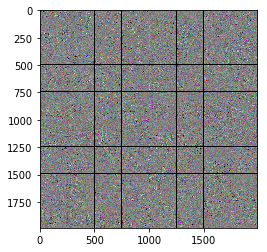

In [10]:
# we will stich the best 64 filters on a 8 x 8 grid.
n = 8

# the filters that have the highest loss are assumed to be better-looking.
# we will only keep the top 64 filters.
kept_filters.sort(key=lambda x: x[1], reverse=True)
kept_filters2 = kept_filters[:n * n]

# build a black picture with enough space for
# our 8 x 8 filters of size 128 x 128, with a 5px margin in between
margin = 5
width = n * img_width + (n - 1) * margin
height = n * img_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

# fill the picture with our saved filters
for i in range(n):
    for j in range(n):
        img, loss = kept_filters2[i*n  + j]
        stitched_filters[(img_width + margin) * i: (img_width + margin) * i + img_width,
                         (img_height + margin) * j: (img_height + margin) * j + img_height, :] = img

# save the result to disk
imsave('stitched_filters_%dx%d.png' % (n, n), stitched_filters)
plt.imshow(stitched_filters)
plt.show()

## Conv1
![VGG 16](conv1.png)

## Conv2
![VGG 16](conv2.png)

## Conv3
![VGG 16](conv3.png)

## Conv4
![VGG 16](conv4.png)

## Conv5
![VGG 16](conv5.png)

![VGG 16](vgg16_filters_overview.jpg)

In [67]:
model = applications.VGG16(include_top=True,weights='imagenet')

#start from a gray image with some noise
img_width = 224
img_height = 224
input_img = model.layers[0].input
print(input_img)
# step size for gradient ascent
step = 0.01


output_index = 208
layer_output = model.layers[-1].output

loss = K.mean(layer_output[0, output_index])
grads = K.gradients(loss,input_img)[0]
#normalize the gradient to have better controll of the stepssizes
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
 # this function returns the loss and grads given the input picture
iterate = K.function([input_img], [loss, grads])

Tensor("input_5:0", shape=(?, 224, 224, 3), dtype=float32)


In [30]:
print(model.layers)
inlay = model.layers
print(inlay[0])
a= inlay[0]
a.batch_input_shape
#grads = K.gradients(loss,a.input)[0]

[<tensorflow.contrib.keras.python.keras.engine.topology.InputLayer object at 0x000000002DC01898>, <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D object at 0x000000002DC01BA8>, <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D object at 0x000000002DC32A90>, <tensorflow.contrib.keras.python.keras.layers.pooling.MaxPooling2D object at 0x000000002DC42940>, <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D object at 0x000000002DC01E48>, <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D object at 0x000000002DC69940>, <tensorflow.contrib.keras.python.keras.layers.pooling.MaxPooling2D object at 0x000000002DCDA940>, <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D object at 0x000000001A6CACC0>, <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D object at 0x000000002DCAB320>, <tensorflow.contrib.keras.python.keras.layers.convolutional.Conv2D object at 0x000000002DD2A7F0>, <tensorflow.contrib.

(None, 224, 224, 3)

Current loss value: 0.000341587
Step: 0
Filter 208 processed 


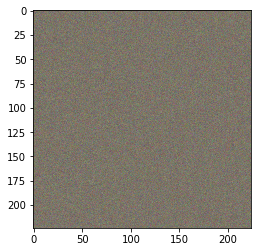

In [73]:
np.random.seed(42)
input_img_data = np.random.normal(0, 10,(1, img_width, img_height, 3))
#input_img_data = (input_img_data - 0.5) * 20 + 128
step = 1
#im = np.expand_dims(input_img_data , axis=0)
for i in range(10):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step        
        #input_img_data = np.clip(input_img_data, 0.-MEAN_VALUES, 255.-MEAN_VALUES)
        img = deprocess_image(input_img_data[0])            
        if i % 10 is 0:
            print('Current loss value:', loss_value)
            print('Step:',i)
            print('Filter %d processed ' % (output_index))
            plt.imshow(img)
            plt.show()

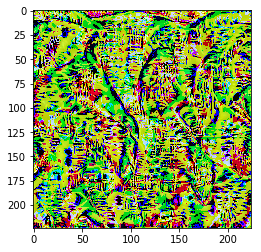

(3, 224, 224)

In [47]:
input_img_data.min()
img[2].mean()
imgT = img.transpose((2,0,1))
img[:,:,0]
rgb = img[...,::-1]
rgb = rgb.astype(np.float32)
rgb[:,:,2] += 103.939 #B
rgb[:,:,1] += 116.779 #G
rgb[:,:,0] += 123.68 #R
rgb = np.clip(rgb,0,255)
plt.imshow(rgb)
plt.show()
imgT.shape

In [27]:
imsave('LabradorRetriever_208_filters_%dx.png' % (18), img)

C:\Users\hes39444\Desktop\Incep0\Inception\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
  """Entry point for launching an IPython kernel.


In [ ]:
    im[:,:,0] -= 103.939 #B
    im[:,:,1] -= 116.779 #G
    im[:,:,2] -= 123.68 #R
    im = im.transpose((2,0,1))

In [76]:
grads_value.max()

1.0639509e-05